## 📂 Mount Google Drive and Copy Dataset

This code block performs the following steps:

1. **Mount Google Drive**  
   Uses the `google.colab` module to mount your Google Drive to the Colab environment so you can access files stored in your Drive.


2. **Copy the Dataset to Local Colab Directory**
   Copies the initial_dataset folder from your Drive path to Colab’s local /content/ directory for easy access during training and processing.

In [1]:
from google.colab import drive
drive.mount('/content/drive')
!cp -r /content/drive/MyDrive/colormatch/dataset/ccHarmony/initial_dataset /content/

Mounted at /content/drive


##  Import Required Libraries

The following Python libraries are imported to support data handling, model training, visualization, and evaluation:


These imports set up the environment for training and evaluating image-based deep learning models, typically in classification or segmentation tasks.


In [2]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 60.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 131.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [15]:
pip install torch torchvision matplotlib pillow

In [16]:
import os
import torchmetrics
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torchvision.transforms.functional as TF
import torchvision.models as models
from skimage.metrics import peak_signal_noise_ratio as psnr_sk
from skimage.metrics import structural_similarity as ssim_sk


from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

##  Generate Image Correspondence Table (Composite, Mask, Real)

This script scans through a dataset of composite images and tries to find the corresponding **real** and **mask** images. It then logs whether the necessary files exist and saves the results in a CSV file.

###  Dataset Directories
- `composite_dir`: Directory containing composite images.
- `mask_dir`: Directory containing segmentation masks.
- `real_dir`: Directory containing the original real images.

###  `find_file` Function
A helper function that searches for a file with a given base name (`base`) in a directory (`folder`) with `.jpg`, `.png`, or `.jpeg` extensions.

```python
def find_file(folder, base):
    for ext in ['.jpg', '.png', '.jpeg']:
        ...


In [4]:
composite_dir = "/content/initial_dataset/composite"
mask_dir = "/content/initial_dataset/masks"
real_dir = "/content/initial_dataset/real"

def find_file(folder, base):
    for ext in [".jpg", ".png", ".jpeg"]:
        path = os.path.join(folder, base + ext)
        if os.path.exists(path):
            return os.path.basename(path)
    return None

composite_files = sorted([f for f in os.listdir(composite_dir) if f.endswith(".jpg")])
results = []
for fname in composite_files:
    parts = fname.split("_")
    if len(parts) < 3:
        continue
    parts = fname.rsplit("_", 2)
    real_prefix = parts[0]
    mask_id = parts[0] + "_" + parts[1]


    real_file = find_file(real_dir, real_prefix)
    mask_file = find_file(mask_dir, mask_id)

    results.append({
        "composite": fname,
        "mask": mask_file or "Not found",
        "real": real_file or "Not found",
        "valid": " Yes" if real_file and mask_file else "No"
    })

df = pd.DataFrame(results)
df.to_csv("initial_composite_mask_real_table.csv", index=False)
print("The table has been saved as ：initial_composite_mask_real_table.csv")


The table has been saved as ：initial_composite_mask_real_table.csv


##  Create PyTorch Dataset from CSV and Prepare DataLoader

This code defines a custom dataset class to load paired image data (composite, mask, real) from a CSV file, then sets up a PyTorch `DataLoader`, and finally splits the dataset into train, validation, and test sets.

---

###  Step 1: Custom Dataset Class – `DatasetFromCSV`
The `DatasetFromCSV` class extends PyTorch’s `Dataset` class:

- **`__init__`**:  
  - Loads the CSV file containing image filenames.
  - Sets a default transformation: resize to 256×256 and convert to tensors.

- **`__len__`**:  
  - Returns the number of samples in the dataset.

- **`__getitem__`**:  
  - Loads the composite, mask, and real images based on the filename stored in the CSV.
  - Applies transformations and returns a dictionary of image tensors.

### Step 2: Load Dataset with DataLoader

  - Batches are created with a size of 4.

  - Data is shuffled to ensure randomness in training.

A sample batch is retrieved and the shapes of the composite, mask, and real tensors are printed. Each image has a shape of [3, 256, 256] or [1, 256, 256] (for grayscale mask).


In [5]:
class DatasetFromCSV(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]

        composite = Image.open(f"/content/initial_dataset/composite/{row['composite']}").convert("RGB")
        mask = Image.open(f"/content/initial_dataset/masks/{row['mask']}").convert("L")
        real = Image.open(f"/content/initial_dataset/real/{row['real']}").convert("RGB")

        return {
            "composite": self.transform(composite),
            "mask": self.transform(mask),
            "real": self.transform(real)
        }


dataset = DatasetFromCSV("initial_composite_mask_real_table.csv")
loader = DataLoader(dataset, batch_size=8, shuffle=True)

batch = next(iter(loader))
print("composite shape:", batch["composite"].shape)
print("mask shape:", batch["mask"].shape)
print("real shape:", batch["real"].shape)


composite shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 1, 256, 256])
real shape: torch.Size([8, 3, 256, 256])


### Step 3: Split into Train, Validation, and Test Sets
 - 70% of the dataset is used for training.

 - 15% for validation and 15% for testing.

CSV files are saved for each subset

In [6]:
df = pd.read_csv("initial_composite_mask_real_table.csv")

train_df, temp_df = train_test_split(df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

train_df.to_csv("initial_train_data.csv", index=False)
val_df.to_csv("initial_val_data.csv", index=False)
test_df.to_csv("initial_test_data.csv", index=False)

print(f"Number of train samples: {len(train_df)}")
print(f"Number of val samples: {len(val_df)}")
print(f"Number of test samples: {len(test_df)}")


Number of train samples: 2982
Number of val samples: 639
Number of test samples: 639


### Step 4:  Load Training, Validation, and Test Sets with DataLoaders

This code loads the previously split datasets (training, validation, and test) from CSV files and wraps them in PyTorch `DataLoader` objects for efficient batch processing.

Load Datasets from CSV


In [7]:
train_dataset = DatasetFromCSV("initial_train_data.csv")
val_dataset = DatasetFromCSV("initial_val_data.csv")
test_dataset = DatasetFromCSV("initial_test_data.csv")

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


**Unet4_GIFT_skipconnect**

##  GIFT Module (Global-Feature-Guided Feature Transformation)

The `GIFT` class is a custom PyTorch module that modulates input features based on global context. It performs spatially-invariant transformation using a global feature vector.

###  Structure:
- `base_conv`: A basic 2D convolution to process the input.
- `scale_mlp`: A small MLP that maps the global feature vector to a scaling vector (via sigmoid activation).

###  Forward Pass:
- The global feature vector (`global_feat`) is passed through the MLP and reshaped to match the input tensor’s shape.
- The input `x` is convolved and then multiplied element-wise with the scale vector.


In [8]:
class GIFT(nn.Module):
    def __init__(self, in_channels, global_feat_dim):
        super(GIFT, self).__init__()
        self.base_conv = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.scale_mlp = nn.Sequential(
            nn.Linear(global_feat_dim, in_channels),
            nn.ReLU(),
            nn.Linear(in_channels, in_channels),
            nn.Sigmoid()
        )

    def forward(self, x, global_feat):
        scale = self.scale_mlp(global_feat).view(x.size(0), -1, 1, 1)  #  用 x.size(0)
        x = self.base_conv(x)
        return x * scale


## UNetWithGIFT

This model is an enhanced U-Net-like architecture that incorporates global feature modulation via the GIFT module in the decoder.

###  Architecture Overview:

#### 🔹 Encoder:
- 2 convolutional blocks (`enc1`, `enc2`) with max pooling (`pool1`, `pool2`).
  
#### 🔹 Bottleneck:
- Two convolutional layers to extract deep features.

#### 🔹 Decoder:
- Two upsampling stages with skip connections.
- `gift` is used to enhance the last decoder output using global features extracted from the bottleneck.

###  Forward Pass:
1. Split the input into `composite` and `mask`.
2. Encode using CNN layers.
3. Extract global features using adaptive average pooling.
4. Decode with skip connections.
5. Apply `gift` to modulate the final feature.
6. Use a final convolution + sigmoid to predict output.
7. **Mask-guided fusion**: output is blended with the original composite using the input mask.


In [9]:
class UNetWithGIFT(nn.Module):
    def __init__(self):
        super(UNetWithGIFT, self).__init__()

        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1), nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1), nn.ReLU(inplace=True)
        )

        # Decoder
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU(inplace=True)
        )

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1_pre_gift = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1), nn.ReLU(inplace=True)
        )

        self.gift = GIFT(64, 256)  # input channels + bottleneck global feat
        self.final_conv = nn.Conv2d(64, 3, kernel_size=1)

    def forward(self, x):
        composite = x[:, :3, :, :]
        mask = x[:, 3:, :, :]

        # Encoder
        enc1 = self.enc1(composite)
        enc2 = self.enc2(self.pool1(enc1))
        bottleneck = self.bottleneck(self.pool2(enc2))

        # Global feature from bottleneck
        global_feat = F.adaptive_avg_pool2d(bottleneck, 1).view(x.size(0), -1)

        # Decoder
        dec2 = self.upconv2(bottleneck)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)


        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)


        dec1 = self.dec1_pre_gift(dec1)
        dec1 = self.gift(dec1, global_feat)

        output = self.final_conv(dec1)
        output = torch.sigmoid(output)

        # Mask-guided fusion
        return output * mask + composite * (1 - mask)



##  Perceptual Loss with Spatial Masking for Image Similarity

This code defines a **masked perceptual loss function** using a pretrained VGG16 network to compare high-level features between an output image and a target image **only within specified masked regions**. It also provides a `joint_loss` function that combines standard pixel-wise L1 loss with the perceptual loss.

### `PerceptualLossMasked` Class

* Uses selected layers (`relu1_2`, `relu2_2`, `relu3_3`, `relu4_3`) from a **frozen VGG16 model** to extract feature maps.
* Applies a **spatial mask** to focus the loss calculation on relevant image regions.
* Computes **L1 distance** between corresponding VGG feature maps of the predicted image and the ground truth image within the masked area.

### `joint_loss` Function

* Combines:

  * **Masked L1 Loss**: penalizes pixel-wise differences in the masked region.
  * **Masked Perceptual Loss**: captures perceptual differences in the masked region using high-level features from VGG16.
* `alpha` controls the trade-off between perceptual and L1 components.



In [10]:
class PerceptualLossMasked(nn.Module):
    def __init__(self, layers_weights={"relu1_2": 1.0, "relu2_2": 1.0, "relu3_3": 0.5, "relu4_3": 0.5}):
        super(PerceptualLossMasked, self).__init__()

        # Load pretrained VGG16
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_FEATURES).features.eval()
        for param in vgg.parameters():
            param.requires_grad = False

        self.layers_weights = layers_weights
        self.vgg_slices = nn.ModuleDict()

        # Slice VGG model up to needed layers
        self.slices = {
            "relu1_2": vgg[:4],   # up to relu1_2
            "relu2_2": vgg[:9],   # up to relu2_2
            "relu3_3": vgg[:16],  # up to relu3_3
            "relu4_3": vgg[:23],  # up to relu4_3
        }
        # Move slices to correct device
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        for name in self.slices:
            self.slices[name] = self.slices[name].to(device)

    def forward(self, input, target, mask):
        loss = 0.0
        x = input
        y = target
        m = mask
        for layer_name, weight in self.layers_weights.items():
            vgg_slice = self.slices[layer_name]
            x_feat = vgg_slice(x)
            y_feat = vgg_slice(y)
            # Resize mask to match feature size
            resized_mask = torch.nn.functional.interpolate(m, size=x_feat.shape[2:], mode='bilinear', align_corners=False)
            # Compute L1 loss only inside mask
            loss += weight * nn.functional.l1_loss(x_feat * resized_mask, y_feat * resized_mask)
        return loss

def joint_loss(output, target, mask, perceptual_loss_fn, alpha=0.1):
     l1 = nn.functional.l1_loss(output * mask, target * mask)
     perceptual = perceptual_loss_fn(output, target, mask)
     return l1 + alpha * perceptual

##  Device Setup and Model Initialization with Perceptual Loss

This code snippet configures the computation device, initializes the `UNetWithGIFT` model and the `PerceptualLossMasked` loss function, and loads the necessary pretrained weights.

###  Device Configuration
```python
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
### Model Initialization
Instantiates the custom U-Net model with global feature modulation (GIFT).

Moves the model to the selected computation device.
### Perceptual Loss Setup
Initializes a masked perceptual loss using selected layers of a pretrained VGG16 model.

Assigns weights to each feature layer for loss calculation.

Sends the loss function to the same device as the model.
### VGG16 Weight Download
These weights are used for extracting deep feature representations in the perceptual loss module.

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


model = UNetWithGIFT().to(device)
perceptual_loss_fn = PerceptualLossMasked(
    layers_weights={
        "relu1_2": 1.0,
        "relu2_2": 1.0,
        "relu3_3": 0.5,
        "relu4_3": 0.5
    }
).to(device)


Using device: cuda


Downloading: "https://download.pytorch.org/models/vgg16_features-amdegroot-88682ab5.pth" to /root/.cache/torch/hub/checkpoints/vgg16_features-amdegroot-88682ab5.pth
100%|██████████| 528M/528M [00:02<00:00, 220MB/s]


In [12]:
print(model)

UNetWithGIFT(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bottleneck): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (upconv2): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
  (dec2): Sequential(
    (0): C

## Training and Validation Workflow
This code implements a PyTorch training loop with support for a perceptual loss function and real-time plotting of training/validation losses.

### train_model(...) Function
- Inputs:

 - model: The neural network model to train.

 - train_loader & val_loader: Data loaders for training and validation sets.

 - perceptual_loss_fn: A perceptual loss function used in addition to joint loss.

 - num_epochs, lr: Number of epochs and learning rate.

 - device: Specifies whether to use CUDA or CPU.

- Training Phase:

 - The model is trained using batches containing composite images, masks, and real target images.

 - Composite and mask tensors are concatenated as input.

 - The loss includes both joint loss and perceptual loss (weighted by alpha=0.1).

- Validation Phase:

 - The model is evaluated on the validation set without gradient updates.

 - Losses are computed similarly and tracked per epoch.

- Output: Returns training and validation loss histories.

### plot_loss_curves(...) Function
Plots the training and validation loss curves using Matplotlib.

Labels and legends are included for clarity.

In [ ]:
def train_model(model, train_loader, val_loader, perceptual_loss_fn, num_epochs=10, lr=0.001, device='cuda' if torch.cuda.is_available() else 'cpu'):
    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    train_loss_history = []
    val_loss_history = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch+1}/{num_epochs}")

        for i, batch in progress_bar:
            composite = batch["composite"].to(device)
            mask = batch["mask"].to(device)
            real = batch["real"].to(device)

            input_tensor = torch.cat([composite, mask], dim=1)
            output = model(input_tensor)

            loss = joint_loss(output, real, mask, perceptual_loss_fn, alpha=0.1)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())

        avg_train_loss = running_loss / len(train_loader)
        train_loss_history.append(avg_train_loss)

        # Validation Phase
        model.eval()
        val_running_loss = 0.0
        with torch.no_grad():
            for batch in val_loader:
                composite = batch["composite"].to(device)
                mask = batch["mask"].to(device)
                real = batch["real"].to(device)

                input_tensor = torch.cat([composite, mask], dim=1)
                output = model(input_tensor)

                val_loss = joint_loss(output, real, mask, perceptual_loss_fn, alpha=0.1)
                val_running_loss += val_loss.item()

        avg_val_loss = val_running_loss / len(val_loader)
        val_loss_history.append(avg_val_loss)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")

    return train_loss_history, val_loss_history


# =====================
# Phase 2: Plot Loss Curves
# =====================

def plot_loss_curves(train_loss, val_loss):
    plt.figure(figsize=(8,5))
    plt.plot(train_loss, label='Train Loss', marker='o')
    plt.plot(val_loss, label='Validation Loss', marker='s')
    plt.title("Training and Validation Loss Curve (Masked Loss)")
    plt.xlabel("Epoch")
    plt.ylabel("Joint Loss")
    plt.grid(True)
    plt.legend()
    plt.show()

Epoch 1/30: 100%|██████████| 47/47 [09:39<00:00, 12.33s/it, loss=0.0259]


Epoch 1/30 | Train Loss: 0.042489 | Val Loss: 0.033885


Epoch 2/30: 100%|██████████| 47/47 [09:34<00:00, 12.23s/it, loss=0.027]


Epoch 2/30 | Train Loss: 0.030994 | Val Loss: 0.031584


Epoch 3/30: 100%|██████████| 47/47 [09:43<00:00, 12.42s/it, loss=0.0288]


Epoch 3/30 | Train Loss: 0.028897 | Val Loss: 0.030564


Epoch 4/30: 100%|██████████| 47/47 [09:24<00:00, 12.02s/it, loss=0.0372]


Epoch 4/30 | Train Loss: 0.028530 | Val Loss: 0.029519


Epoch 5/30: 100%|██████████| 47/47 [09:33<00:00, 12.21s/it, loss=0.019]


Epoch 5/30 | Train Loss: 0.028328 | Val Loss: 0.029574


Epoch 6/30: 100%|██████████| 47/47 [09:40<00:00, 12.34s/it, loss=0.0321]


Epoch 6/30 | Train Loss: 0.028301 | Val Loss: 0.029308


Epoch 7/30: 100%|██████████| 47/47 [09:17<00:00, 11.87s/it, loss=0.0278]


Epoch 7/30 | Train Loss: 0.027430 | Val Loss: 0.028134


Epoch 8/30: 100%|██████████| 47/47 [09:10<00:00, 11.71s/it, loss=0.0257]


Epoch 8/30 | Train Loss: 0.026952 | Val Loss: 0.028284


Epoch 9/30: 100%|██████████| 47/47 [09:41<00:00, 12.38s/it, loss=0.0268]


Epoch 9/30 | Train Loss: 0.027131 | Val Loss: 0.029189


Epoch 10/30: 100%|██████████| 47/47 [09:26<00:00, 12.06s/it, loss=0.0249]


Epoch 10/30 | Train Loss: 0.026715 | Val Loss: 0.027046


Epoch 11/30: 100%|██████████| 47/47 [09:43<00:00, 12.41s/it, loss=0.0255]


Epoch 11/30 | Train Loss: 0.026100 | Val Loss: 0.027762


Epoch 12/30: 100%|██████████| 47/47 [09:29<00:00, 12.12s/it, loss=0.0272]


Epoch 12/30 | Train Loss: 0.026113 | Val Loss: 0.026751


Epoch 13/30: 100%|██████████| 47/47 [09:25<00:00, 12.02s/it, loss=0.0228]


Epoch 13/30 | Train Loss: 0.025597 | Val Loss: 0.026631


Epoch 14/30: 100%|██████████| 47/47 [09:32<00:00, 12.17s/it, loss=0.024]


Epoch 14/30 | Train Loss: 0.025591 | Val Loss: 0.026459


Epoch 15/30: 100%|██████████| 47/47 [09:42<00:00, 12.40s/it, loss=0.0213]


Epoch 15/30 | Train Loss: 0.025063 | Val Loss: 0.026323


Epoch 16/30: 100%|██████████| 47/47 [09:30<00:00, 12.15s/it, loss=0.0329]


Epoch 16/30 | Train Loss: 0.025009 | Val Loss: 0.025773


Epoch 17/30: 100%|██████████| 47/47 [09:45<00:00, 12.46s/it, loss=0.0214]


Epoch 17/30 | Train Loss: 0.024535 | Val Loss: 0.025756


Epoch 18/30: 100%|██████████| 47/47 [09:49<00:00, 12.53s/it, loss=0.0199]


Epoch 18/30 | Train Loss: 0.024125 | Val Loss: 0.025591


Epoch 19/30: 100%|██████████| 47/47 [09:39<00:00, 12.33s/it, loss=0.0198]


Epoch 19/30 | Train Loss: 0.024005 | Val Loss: 0.024681


Epoch 20/30: 100%|██████████| 47/47 [09:38<00:00, 12.31s/it, loss=0.0182]


Epoch 20/30 | Train Loss: 0.023696 | Val Loss: 0.024516


Epoch 21/30: 100%|██████████| 47/47 [09:44<00:00, 12.44s/it, loss=0.0214]


Epoch 21/30 | Train Loss: 0.023753 | Val Loss: 0.026017


Epoch 22/30: 100%|██████████| 47/47 [09:29<00:00, 12.11s/it, loss=0.0181]


Epoch 22/30 | Train Loss: 0.023653 | Val Loss: 0.024588


Epoch 23/30: 100%|██████████| 47/47 [09:15<00:00, 11.83s/it, loss=0.0231]


Epoch 23/30 | Train Loss: 0.023274 | Val Loss: 0.024572


Epoch 24/30: 100%|██████████| 47/47 [09:07<00:00, 11.65s/it, loss=0.0215]


Epoch 24/30 | Train Loss: 0.023003 | Val Loss: 0.025958


Epoch 25/30: 100%|██████████| 47/47 [09:31<00:00, 12.16s/it, loss=0.0145]


Epoch 25/30 | Train Loss: 0.023638 | Val Loss: 0.024137


Epoch 26/30: 100%|██████████| 47/47 [09:47<00:00, 12.50s/it, loss=0.0219]


Epoch 26/30 | Train Loss: 0.022664 | Val Loss: 0.024002


Epoch 27/30: 100%|██████████| 47/47 [09:47<00:00, 12.51s/it, loss=0.0255]


Epoch 27/30 | Train Loss: 0.022525 | Val Loss: 0.023653


Epoch 28/30: 100%|██████████| 47/47 [09:22<00:00, 11.98s/it, loss=0.0288]


Epoch 28/30 | Train Loss: 0.022301 | Val Loss: 0.023369


Epoch 29/30: 100%|██████████| 47/47 [09:47<00:00, 12.49s/it, loss=0.0183]


Epoch 29/30 | Train Loss: 0.022007 | Val Loss: 0.024128


Epoch 30/30: 100%|██████████| 47/47 [09:43<00:00, 12.41s/it, loss=0.0213]


Epoch 30/30 | Train Loss: 0.022515 | Val Loss: 0.026281


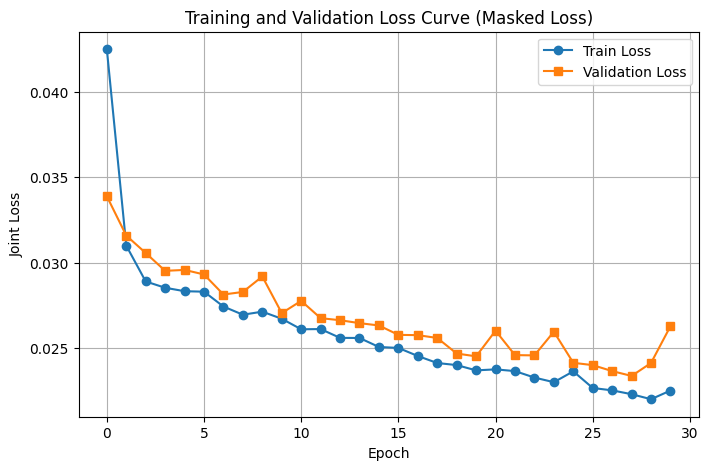

In [ ]:
# Usage Example: 64，30
train_loss_history, val_loss_history = train_model(model, train_loader, val_loader, perceptual_loss_fn, num_epochs=30)
plot_loss_curves(train_loss_history, val_loss_history)

##  Saving Model Checkpoint

After training 30 epochs, the model weights are saved to disk for future evaluation or inference:

In [ ]:
save_name = "Unet4_epoch30t_time.pth"
torch.save(model.state_dict(), save_name)

## Resume Training from Saved Checkpoint

This function allows you to **resume training** a `UNetWithGIFT` model from a saved `.pth` checkpoint file, while logging both training and validation loss for analysis.

---

###  Function: `train_model_continue(...)`

####  Parameters

| Parameter            | Description                                                     |
| -------------------- | --------------------------------------------------------------- |
| `model`              | The `UNetWithGIFT` model instance                               |
| `train_loader`       | Training `DataLoader`                                           |
| `val_loader`         | Validation `DataLoader`                                         |
| `perceptual_loss_fn` | Predefined perceptual loss module (e.g. `PerceptualLossMasked`) |
| `start_epoch`        | Epoch to resume training from (default: `30`)                   |
| `total_epochs`       | Final epoch to train to (default: `50`)                         |
| `lr`                 | Learning rate (default: `0.001`)                                |
| `device`             | Computation device (`cuda` if available)                        |
| `model_path`         | Path to pretrained weights (e.g. `Unet4_epoch30t_time.pth`)     |

---

###  Training Workflow

1. **Load weights** from `model_path`.
2. Reinitialize the **Adam optimizer**.
3. Loop over training epochs:

   * Train model using **masked joint loss** (`L1 + perceptual`).
   * Validate model on the validation set after each epoch.
4. After each epoch:

   * Save model weights (`Unet4_epoch50t_time.pth`).
   * Record and print train/val loss.

---

###  `plot_loss_curves(...)`

* Plots training and validation loss over the given epoch range.
* Useful for **visualizing convergence** and **detecting overfitting**.


In [ ]:
def train_model_continue(
    model,
    train_loader,
    val_loader,
    perceptual_loss_fn,
    start_epoch=30,
    total_epochs=50,
    lr=0.001,
    device='cuda' if torch.cuda.is_available() else 'cpu',
    model_path="/content/Unet4_epoch30t_time.pth"
):

    model.load_state_dict(torch.load(model_path))
    model = model.to(device)

    # Reinitialize the optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    train_loss_history = []
    val_loss_history = []

    for epoch in range(start_epoch, total_epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch+1}/{total_epochs}")

        for i, batch in progress_bar:
            composite = batch["composite"].to(device)
            mask = batch["mask"].to(device)
            real = batch["real"].to(device)

            input_tensor = torch.cat([composite, mask], dim=1)
            output = model(input_tensor)

            loss = joint_loss(output, real, mask, perceptual_loss_fn, alpha=0.1)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())

        avg_train_loss = running_loss / len(train_loader)
        train_loss_history.append(avg_train_loss)

        # Validation Phase
        model.eval()
        val_running_loss = 0.0
        with torch.no_grad():
            for batch in val_loader:
                composite = batch["composite"].to(device)
                mask = batch["mask"].to(device)
                real = batch["real"].to(device)

                input_tensor = torch.cat([composite, mask], dim=1)
                output = model(input_tensor)

                val_loss = joint_loss(output, real, mask, perceptual_loss_fn, alpha=0.1)
                val_running_loss += val_loss.item()

        avg_val_loss = val_running_loss / len(val_loader)
        val_loss_history.append(avg_val_loss)

        print(f"Epoch {epoch+1}/{total_epochs} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")
        save_name = f"Unet4_epoch50t_time.pth"
        torch.save(model.state_dict(), save_name)

    return train_loss_history, val_loss_history

def plot_loss_curves(train_loss, val_loss, start_epoch=0):
    epochs = list(range(start_epoch + 1, start_epoch + 1 + len(train_loss)))

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, train_loss, label='Train Loss', marker='o')
    plt.plot(epochs, val_loss, label='Validation Loss', marker='s')
    plt.title("Training and Validation Loss Curve (Masked Joint Loss)")
    plt.xlabel("Epoch")
    plt.ylabel("Joint Loss")
    plt.grid(True)
    plt.legend()
    plt.xticks(epochs)
    plt.tight_layout()
    plt.show()



##  Continued Training: Epochs 30 → 50

This training session **resumes the training** of a `UNetWithGIFT` model from an existing checkpoint at **epoch 30**, continuing for another **20 epochs** to reach epoch **50**.

---

###  Training Configuration

| Parameter       | Value                       |
| --------------- | --------------------------- |
| Start Epoch     | 30                          |
| End Epoch       | 50                          |
| Learning Rate   | 0.0005                      |
| Batch Size      | 16                          |
| Loss Function   | L1 + Masked Perceptual Loss |
| Checkpoint Path | `Unet4_epoch30t_time.pth`   |
| Device          | `cuda` (if available)       |

---

###  Data Preparation

* **Training Set**: Loaded with shuffling enabled for effective learning.
* **Validation Set**: Used to track generalization performance, no shuffling.

---

###  Training Logic (`train_model_continue`)

This function:

* Loads model weights from the epoch 30 `.pth` file.
* Continues training using the provided `train_loader` and `val_loader`.
* Logs both **training loss** and **validation loss** at each epoch.
* Returns two loss lists for visualization.

---

###  Loss Curve Visualization

* `plot_loss_curves(train_loss, val_loss, start_epoch=30)` plots:

  * **Training loss**
  * **Validation loss**
* The x-axis begins at **epoch 30** to clearly show progression from the resumed checkpoint.

Epoch 31/50: 100%|██████████| 187/187 [09:48<00:00,  3.15s/it, loss=0.014]


Epoch 31/50 | Train Loss: 0.022100 | Val Loss: 0.023995


Epoch 32/50: 100%|██████████| 187/187 [09:48<00:00,  3.15s/it, loss=0.0198]


Epoch 32/50 | Train Loss: 0.021696 | Val Loss: 0.023220


Epoch 33/50: 100%|██████████| 187/187 [09:49<00:00,  3.15s/it, loss=0.0153]


Epoch 33/50 | Train Loss: 0.021634 | Val Loss: 0.023890


Epoch 34/50: 100%|██████████| 187/187 [09:50<00:00,  3.16s/it, loss=0.0136]


Epoch 34/50 | Train Loss: 0.021142 | Val Loss: 0.023154


Epoch 35/50: 100%|██████████| 187/187 [09:51<00:00,  3.16s/it, loss=0.0245]


Epoch 35/50 | Train Loss: 0.021283 | Val Loss: 0.023208


Epoch 36/50: 100%|██████████| 187/187 [09:49<00:00,  3.15s/it, loss=0.0259]


Epoch 36/50 | Train Loss: 0.021152 | Val Loss: 0.023130


Epoch 37/50: 100%|██████████| 187/187 [09:59<00:00,  3.20s/it, loss=0.0137]


Epoch 37/50 | Train Loss: 0.020948 | Val Loss: 0.022920


Epoch 38/50: 100%|██████████| 187/187 [10:00<00:00,  3.21s/it, loss=0.0173]


Epoch 38/50 | Train Loss: 0.020532 | Val Loss: 0.023004


Epoch 39/50: 100%|██████████| 187/187 [10:00<00:00,  3.21s/it, loss=0.0108]


Epoch 39/50 | Train Loss: 0.020720 | Val Loss: 0.022137


Epoch 40/50: 100%|██████████| 187/187 [09:57<00:00,  3.20s/it, loss=0.0197]


Epoch 40/50 | Train Loss: 0.020361 | Val Loss: 0.021975


Epoch 41/50: 100%|██████████| 187/187 [09:58<00:00,  3.20s/it, loss=0.0154]


Epoch 41/50 | Train Loss: 0.020082 | Val Loss: 0.022985


Epoch 42/50: 100%|██████████| 187/187 [09:54<00:00,  3.18s/it, loss=0.0448]


Epoch 42/50 | Train Loss: 0.020090 | Val Loss: 0.021592


Epoch 43/50: 100%|██████████| 187/187 [09:59<00:00,  3.21s/it, loss=0.0101]


Epoch 43/50 | Train Loss: 0.019923 | Val Loss: 0.022784


Epoch 44/50: 100%|██████████| 187/187 [10:00<00:00,  3.21s/it, loss=0.0226]


Epoch 44/50 | Train Loss: 0.019619 | Val Loss: 0.021453


Epoch 45/50: 100%|██████████| 187/187 [10:00<00:00,  3.21s/it, loss=0.0208]


Epoch 45/50 | Train Loss: 0.019447 | Val Loss: 0.021461


Epoch 46/50: 100%|██████████| 187/187 [09:58<00:00,  3.20s/it, loss=0.015]


Epoch 46/50 | Train Loss: 0.019059 | Val Loss: 0.021369


Epoch 47/50: 100%|██████████| 187/187 [09:58<00:00,  3.20s/it, loss=0.014]


Epoch 47/50 | Train Loss: 0.019185 | Val Loss: 0.021159


Epoch 48/50: 100%|██████████| 187/187 [09:58<00:00,  3.20s/it, loss=0.022]


Epoch 48/50 | Train Loss: 0.018849 | Val Loss: 0.020297


Epoch 49/50: 100%|██████████| 187/187 [09:59<00:00,  3.21s/it, loss=0.0134]


Epoch 49/50 | Train Loss: 0.018531 | Val Loss: 0.021520


Epoch 50/50: 100%|██████████| 187/187 [09:57<00:00,  3.20s/it, loss=0.0138]


Epoch 50/50 | Train Loss: 0.018526 | Val Loss: 0.020217


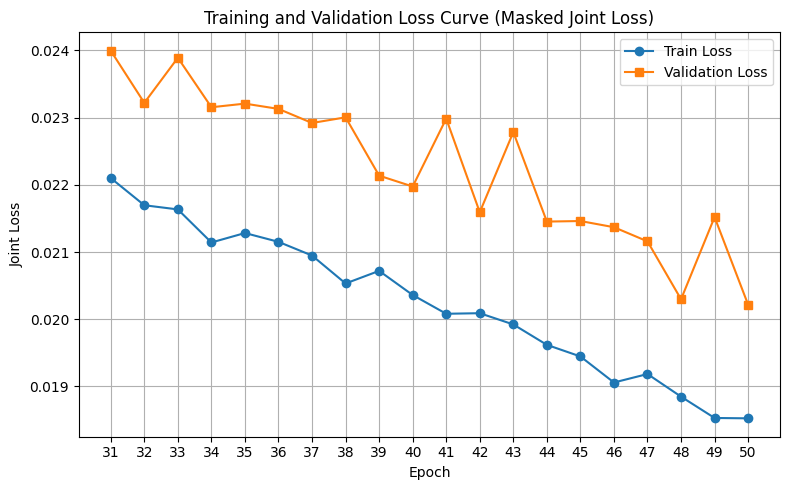

In [ ]:
new_batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=new_batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=new_batch_size, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_loss, val_loss = train_model_continue(

    model=UNetWithGIFT().to(device),
    train_loader=train_loader,
    val_loader=val_loader,
    perceptual_loss_fn=perceptual_loss_fn,
    start_epoch=30,
    total_epochs=50,
    lr=0.0005,
    model_path="Unet4_epoch30t_time.pth"
)
plot_loss_curves(train_loss, val_loss, start_epoch=30)


##  Saving Model Checkpoint

After training up to epoch 50, the model weights are saved to disk for future evaluation or inference:

In [ ]:
save_name = "Unet4_epoch50t_time.pth"
torch.save(model.state_dict(), save_name)

##  Continued Training: Epochs 50 → 70

This section resumes training from a pretrained model checkpoint at **epoch 50**, continuing for another **20 epochs** (up to epoch 70) with an updated training configuration.

---

###  Training Configuration

| Setting       | Value                                                     |
| ------------- | --------------------------------------------------------- |
| Model         | `UNetWithGIFT`                                            |
| Resume From   | `Unet4_epoch50t_time.pth`                                 |
| Epoch Range   | 50 → 70                                                   |
| Learning Rate | 0.0005                                                    |
| Batch Size    | 16                                                        |
| Loss Function | Combination of **L1 Loss** and **Masked Perceptual Loss** |
| Device        | `cuda` (if available)                                     |

---

###  DataLoader Setup

* `train_loader`: Loads shuffled training batches.
* `val_loader`: Loads validation batches for periodic evaluation (no shuffling).

---

###  Training Flow (`train_model_continue`)

1. Loads existing model weights from epoch 50.
2. Resumes training while maintaining continuity of optimizer state (if included).
3. Calculates both **training and validation loss** for each epoch.
4. Saves intermediate weights if desired (can be built into function).

---

###  Loss Visualization

After training:

* The function `plot_loss_curves()` is called to display **training vs. validation loss trends** across epochs 50–70.
* Useful to analyze:

  * Whether training is still effective.
  * If overfitting begins after epoch 50.
  * General convergence behavior.

---


Epoch 51/70: 100%|██████████| 187/187 [09:48<00:00,  3.15s/it, loss=0.0202]


Epoch 51/70 | Train Loss: 0.018650 | Val Loss: 0.021184


Epoch 52/70: 100%|██████████| 187/187 [09:49<00:00,  3.15s/it, loss=0.0198]


Epoch 52/70 | Train Loss: 0.018234 | Val Loss: 0.019864


Epoch 53/70: 100%|██████████| 187/187 [09:46<00:00,  3.14s/it, loss=0.0211]


Epoch 53/70 | Train Loss: 0.018033 | Val Loss: 0.020660


Epoch 54/70: 100%|██████████| 187/187 [09:50<00:00,  3.16s/it, loss=0.0138]


Epoch 54/70 | Train Loss: 0.018027 | Val Loss: 0.020012


Epoch 55/70: 100%|██████████| 187/187 [09:49<00:00,  3.15s/it, loss=0.0162]


Epoch 55/70 | Train Loss: 0.017757 | Val Loss: 0.019741


Epoch 56/70: 100%|██████████| 187/187 [09:49<00:00,  3.15s/it, loss=0.0166]


Epoch 56/70 | Train Loss: 0.017500 | Val Loss: 0.019642


Epoch 57/70: 100%|██████████| 187/187 [09:48<00:00,  3.14s/it, loss=0.0155]


Epoch 57/70 | Train Loss: 0.017327 | Val Loss: 0.019515


Epoch 58/70: 100%|██████████| 187/187 [09:48<00:00,  3.15s/it, loss=0.0103]


Epoch 58/70 | Train Loss: 0.017348 | Val Loss: 0.020018


Epoch 59/70: 100%|██████████| 187/187 [09:48<00:00,  3.15s/it, loss=0.0283]


Epoch 59/70 | Train Loss: 0.017261 | Val Loss: 0.019130


Epoch 60/70: 100%|██████████| 187/187 [09:46<00:00,  3.14s/it, loss=0.0136]


Epoch 60/70 | Train Loss: 0.017183 | Val Loss: 0.019523


Epoch 61/70: 100%|██████████| 187/187 [09:45<00:00,  3.13s/it, loss=0.0112]


Epoch 61/70 | Train Loss: 0.017187 | Val Loss: 0.019520


Epoch 62/70: 100%|██████████| 187/187 [09:43<00:00,  3.12s/it, loss=0.0264]


Epoch 62/70 | Train Loss: 0.016961 | Val Loss: 0.019082


Epoch 63/70: 100%|██████████| 187/187 [09:39<00:00,  3.10s/it, loss=0.00615]


Epoch 63/70 | Train Loss: 0.016605 | Val Loss: 0.018762


Epoch 64/70: 100%|██████████| 187/187 [09:39<00:00,  3.10s/it, loss=0.00665]


Epoch 64/70 | Train Loss: 0.016467 | Val Loss: 0.018759


Epoch 65/70: 100%|██████████| 187/187 [09:43<00:00,  3.12s/it, loss=0.0158]


Epoch 65/70 | Train Loss: 0.016566 | Val Loss: 0.018420


Epoch 66/70: 100%|██████████| 187/187 [09:43<00:00,  3.12s/it, loss=0.0182]


Epoch 66/70 | Train Loss: 0.016883 | Val Loss: 0.018862


Epoch 67/70: 100%|██████████| 187/187 [09:40<00:00,  3.10s/it, loss=0.0245]


Epoch 67/70 | Train Loss: 0.016512 | Val Loss: 0.018339


Epoch 68/70: 100%|██████████| 187/187 [09:39<00:00,  3.10s/it, loss=0.0163]


Epoch 68/70 | Train Loss: 0.016222 | Val Loss: 0.018959


Epoch 69/70: 100%|██████████| 187/187 [09:40<00:00,  3.10s/it, loss=0.00609]


Epoch 69/70 | Train Loss: 0.016191 | Val Loss: 0.018419


Epoch 70/70: 100%|██████████| 187/187 [09:37<00:00,  3.09s/it, loss=0.014]


Epoch 70/70 | Train Loss: 0.015949 | Val Loss: 0.018213


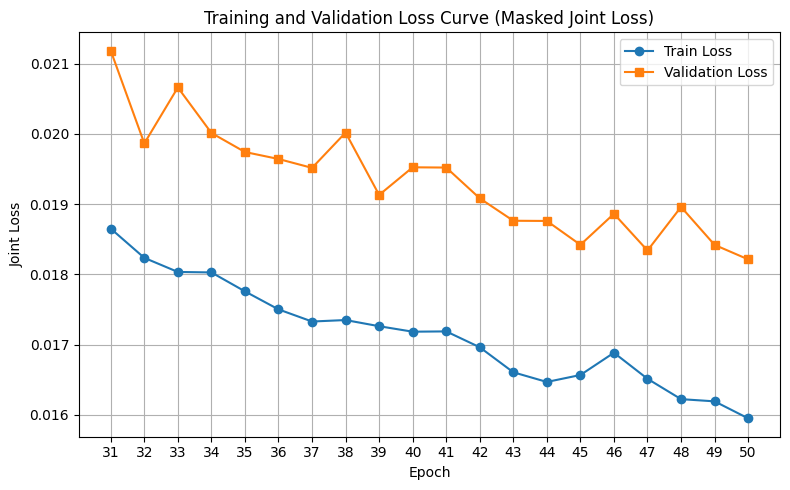

In [ ]:
# 50-70 epochs
new_batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=new_batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=new_batch_size, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_loss, val_loss = train_model_continue(

    model=UNetWithGIFT().to(device),
    train_loader=train_loader,
    val_loader=val_loader,
    perceptual_loss_fn=perceptual_loss_fn,
    start_epoch=50,
    total_epochs=70,
    lr=0.0005,
    model_path="/content/Unet4_epoch50t_time.pth"
)
plot_loss_curves(train_loss, val_loss, start_epoch=30)


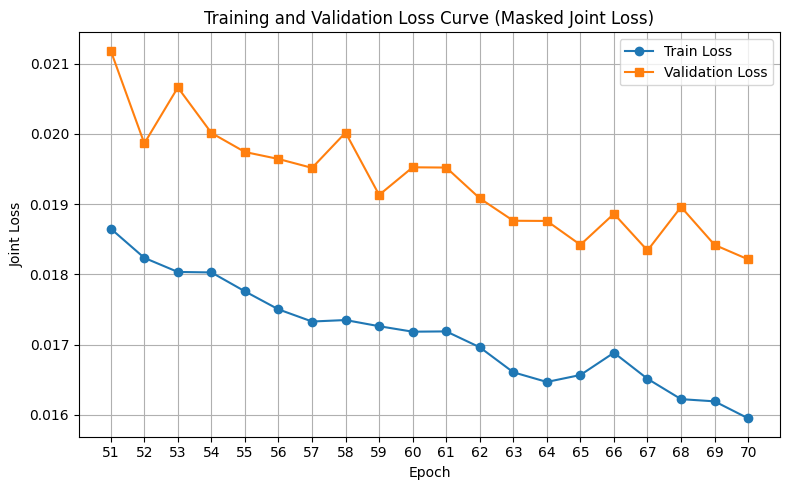

In [ ]:
plot_loss_curves(train_loss, val_loss, start_epoch=50)

##  Saving Final Model Checkpoint

After completing training up to epoch 70, the model weights are saved to disk for future evaluation or inference:

In [ ]:
save_name = "Unet4_epoch70t_time.pth"
torch.save(model.state_dict(), save_name)


## Model Output Comparison Across Epochs
This section visualizes and compares the output quality of three versions of the UNetWithGIFT model trained for different numbers of epochs (30, 50, and 70), alongside the corresponding input and ground truth.

- Setup
Device Selection: Automatically selects GPU if available.

- Model Loading:
All models share the same architecture and are loaded with their respective .pth checkpoint files.

- Input Preparation
A batch of test samples is loaded using a DataLoader.

Each sample contains:

composite: Input image.

mask: Foreground region indicator.

real: Ground truth (reference target).

The composite and mask are concatenated along the channel dimension to form the model input.

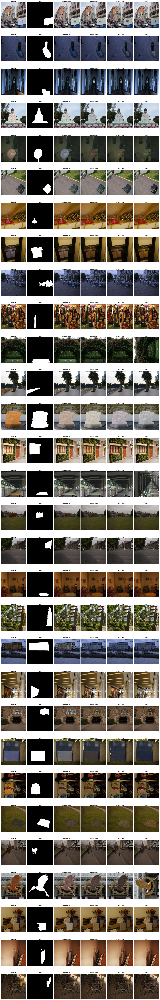

In [18]:
# Device Confirmation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Model definition and loading
model1 = UNetWithGIFT().to(device)
model2 = UNetWithGIFT().to(device)
model3 = UNetWithGIFT().to(device)

model1.load_state_dict(torch.load("/content/Unet4_epoch30t_time.pth"))
model2.load_state_dict(torch.load("/content/Unet4_epoch50t_time.pth"))
model3.load_state_dict(torch.load("/content/Unet4_epoch70t_time.pth"))

model1.eval()
model2.eval()
model3.eval()

# DataLoader
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Get data batch
sample_batch = next(iter(test_loader))
composite = sample_batch["composite"].to(device)
mask = sample_batch["mask"].to(device)
real = sample_batch["real"].to(device)
input_tensor = torch.cat([composite, mask], dim=1).to(device)


with torch.no_grad():
    output1 = model1(input_tensor)
    output2 = model2(input_tensor)
    output3 = model3(input_tensor)

def show_image(tensor, title, idx):
    image = tensor[idx].cpu().detach()
    if image.shape[0] == 1:
        image = image.squeeze(0)
        plt.imshow(image, cmap="gray")
    else:
        image = image.permute(1, 2, 0)
        plt.imshow(image)
    plt.axis("off")
    plt.title(title)

num_show =30
plt.figure(figsize=(24, num_show * 5))

for i in range(num_show):
    # Composite
    plt.subplot(num_show, 6, i * 6 + 1)
    show_image(composite, "Composite", i)

    # Mask
    plt.subplot(num_show, 6, i * 6 + 2)
    show_image(mask, "Mask", i)

    # Model1 Output
    plt.subplot(num_show, 6, i * 6 + 3)
    show_image(output1, "30epoch Output", i)

    # Model2 Output
    plt.subplot(num_show, 6, i * 6 + 4)
    show_image(output2, "50epoch Output", i)

    # Model3 Output
    plt.subplot(num_show, 6, i * 6 + 5)
    show_image(output3, "70epoch Output", i)

    # Real Ground Truth
    plt.subplot(num_show, 6, i * 6 + 6)
    show_image(real, "Real", i)

plt.tight_layout()
plt.show()



##  Quantitative Evaluation: Multi-Model Comparison on Test Set

This code evaluates and compares three `UNetWithGIFT` models trained for **30, 50, and 70 epochs** on a shared test dataset using four key image quality metrics.

---

###  Evaluation Setup

* **Device Selection**: Automatically chooses GPU (`cuda`) if available, otherwise falls back to CPU.
* **Models**:

  * `model1`: 30 epochs
  * `model2`: 50 epochs
  * `model3`: 70 epochs
    All models share the same architecture and are loaded from corresponding `.pth` files.

---

###  Metrics Used

| Metric    | Description                                                    |
| --------- | -------------------------------------------------------------- |
| **MSE**   | Mean Squared Error across the entire image.                    |
| **fMSE**  | Foreground-only MSE (mask-guided error).                       |
| **PSNR**  | Peak Signal-to-Noise Ratio (measured in dB, higher is better). |
| **fSSIM** | Structural Similarity Index over foreground regions.           |


---

###  Evaluation Flow

For each model:

1. **Switch to eval mode**, disable gradients.
2. Iterate over test batches:

   * Extract `composite`, `mask`, and `real` images.
   * Construct a 4-channel input from `composite` + `mask`.
   * Compute:

     * Full-image **MSE**
     * Foreground-only **fMSE**
     * **PSNR** from MSE
     * **fSSIM** (foreground SSIM)
3. Accumulate and average results across the entire test set.
4. Convert MSE-based metrics to **\[0, 255] scale** for interpretability.

In [ ]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the evaluation function
def evaluate_metrics(models, model_names, dataloader, device):
    mse_fn = nn.MSELoss()
    ssim_fn = torchmetrics.StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

    for model, name in zip(models, model_names):
        model.eval()
        total_mse, total_fmse, total_psnr, total_fssim, count = 0.0, 0.0, 0.0, 0.0, 0

        with torch.no_grad():
            for batch in dataloader:
                composite = batch["composite"].to(device)
                mask = batch["mask"].to(device)
                real = batch["real"].to(device)
                foreground = mask.repeat(1, 3, 1, 1)

                input_tensor = torch.cat([composite, mask], dim=1)
                output = model(input_tensor)

                mse = mse_fn(output, real)
                fmse = mse_fn(output * foreground, real * foreground)
                psnr = 10 * torch.log10(1 / mse)
                fssim = ssim_fn(output * foreground, real * foreground)

                batch_size = composite.size(0)
                total_mse += mse.item() * batch_size
                total_fmse += fmse.item() * batch_size
                total_psnr += psnr.item() * batch_size
                total_fssim += fssim.item() * batch_size
                count += batch_size

        # Convert to [0,255] range
        avg_mse_255 = (total_mse / count) * (255 ** 2)
        avg_fmse_255 = (total_fmse / count) * (255 ** 2)
        avg_mse = total_mse / count
        avg_psnr_255 = 10 * torch.log10(torch.tensor(255.0**2) / (avg_mse * 255**2))  # adjust PSNR based on 255

        avg_fssim = total_fssim / count

        # print
        print(f"\n=== Evaluation for {name} ===")
        print(f"Total samples: {count}")
        print("Results in [0,255] range:")
        print(f"MSE: {avg_mse_255:.2f}")
        print(f"fMSE: {avg_fmse_255:.2f}")
        print(f"PSNR: {avg_psnr_255:.2f} dB")
        print(f"fSSIM: {avg_fssim:.6f}")
        print("===========================\n")

# Load three model weights
model1 = UNetWithGIFT().to(device)
model2 = UNetWithGIFT().to(device)
model3 = UNetWithGIFT().to(device)

model1.load_state_dict(torch.load("/content/Unet4_GIFTT64batch_30epoch20250430_043444.pth"))
model2.load_state_dict(torch.load("/content/Unet4_epoch50t_time.pth"))
model3.load_state_dict(torch.load("/content/Unet4_epoch70t_time.pth"))

# List of models and names
models = [model1, model2, model3]
model_names = ["30epoch", "50epoch", "70epoch"]

# Evaluate (make sure shuffle=False)
evaluate_metrics(models, model_names, test_loader, device)



=== Evaluation for Model1 ===
Total samples: 639
Results in [0,255] range:
MSE: 201.22
fMSE: 106.35
PSNR: 25.09 dB
fSSIM: 0.981049


=== Evaluation for Model2 ===
Total samples: 639
Results in [0,255] range:
MSE: 153.20
fMSE: 58.81
PSNR: 26.28 dB
fSSIM: 0.986143


=== Evaluation for Model3 ===
Total samples: 639
Results in [0,255] range:
MSE: 141.86
fMSE: 47.62
PSNR: 26.61 dB
fSSIM: 0.988144



##  Evaluation by Foreground Ratio Bins

This section provides a **fine-grained evaluation** of three trained `UNetWithGIFT` models (trained for 30, 50, and 70 epochs) by analyzing performance across samples with **different foreground area proportions**.

---

###  Motivation

In image harmonization tasks, **foreground area size** can significantly impact model performance. This evaluation:

* Segments the validation data into **three ratio bins** based on the percentage of the image covered by foreground (mask).
* Computes metrics **within each bin**, enabling a better understanding of model behavior under different editing complexities.

---

###  Foreground Ratio Bins

| Bin Index | Foreground Ratio Range | Description              |
| --------- | ---------------------- | ------------------------ |
| Bin 1     | 0% \~ 5%               | Minimal foreground edits |
| Bin 2     | 5% \~ 15%              | Moderate edits           |
| Bin 3     | 15% \~ 100%            | Large foreground regions |

Each test image is categorized into one of these bins based on its foreground mask area.

---

###  Evaluation Flow

1. **For each image** in the validation set:

   * Resize input to 256×256.
   * Forward pass through the model.
   * Convert model output, real image, and mask to NumPy.
   * Compute metrics for both the full image and foreground-only regions.
   * Bin the sample by its foreground ratio and accumulate the metrics.

2. **Repeat for each model** (30, 50, and 70 epoch checkpoints).

3. **Average metrics** per bin for each model.

---

###  Visualization

Plots are generated for each of the following metrics:

* **Foreground MSE**
* **PSNR**
* **Foreground SSIM**

Each plot:

* Compares the three models across the foreground ratio bins.


🔍 Evaluating: 30 Epoch
📊 Evaluation by Foreground Ratio Bins:
Ratio       Count   Avg fMSE    Avg MSE   Avg PSNR    Avg fSSIM
0–5%          219    1026.60      78.58      35.87       0.8668
5–15%         279    1295.38     256.49      30.17       0.8421
15–100%       141     790.89     196.71      27.19       0.8882

🔍 Evaluating: 50 Epoch
📊 Evaluation by Foreground Ratio Bins:
Ratio       Count   Avg fMSE    Avg MSE   Avg PSNR    Avg fSSIM
0–5%          219     641.52      66.45      37.74       0.8908
5–15%         279     724.88     199.43      33.13       0.8853
15–100%       141     432.30     112.13      30.15       0.9237

🔍 Evaluating: 70 Epoch
📊 Evaluation by Foreground Ratio Bins:
Ratio       Count   Avg fMSE    Avg MSE   Avg PSNR    Avg fSSIM
0–5%          219     605.97      64.79      38.11       0.8943
5–15%         279     630.41     190.26      33.99       0.8963
15–100%       141     316.84      78.59      31.22       0.9377


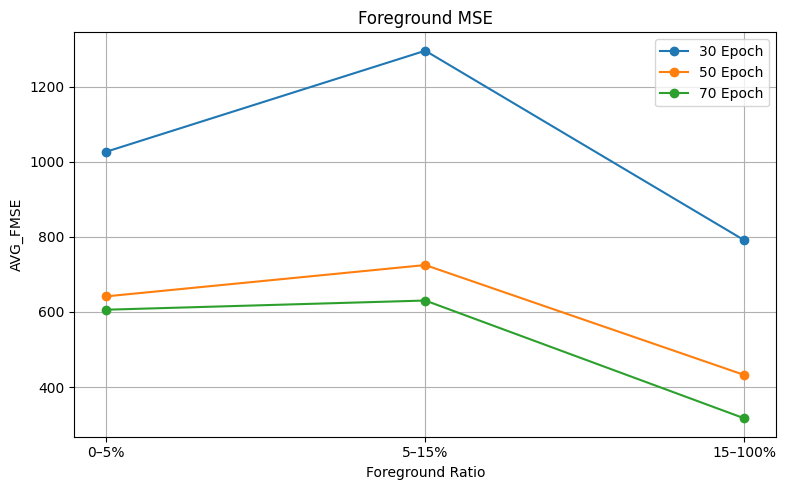

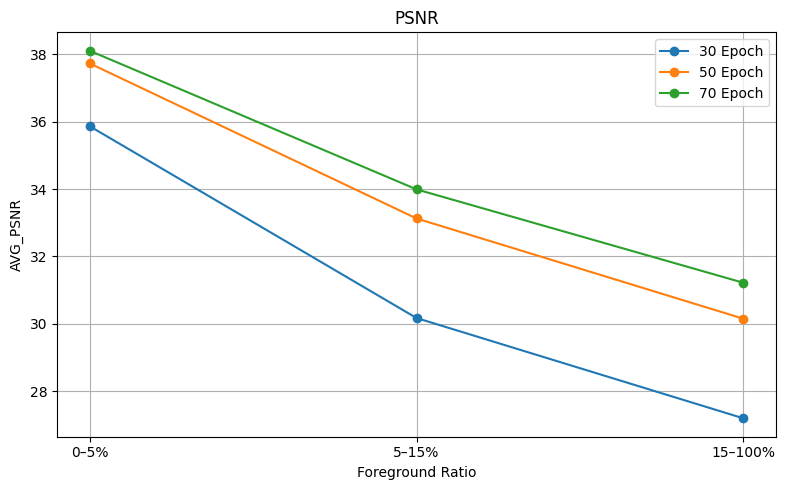

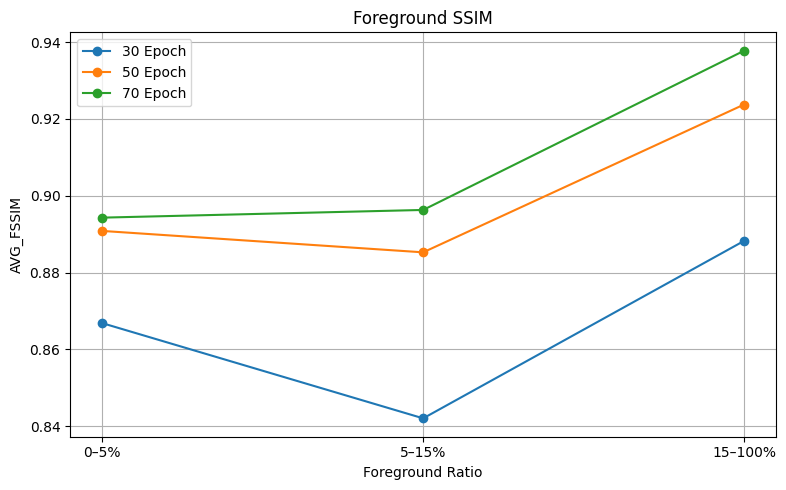

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Load three models
model1 = UNetWithGIFT().to(device)
model2 = UNetWithGIFT().to(device)
model3 = UNetWithGIFT().to(device)

model1.load_state_dict(torch.load("/content/Unet4_epoch30t_time.pth"))
model2.load_state_dict(torch.load("/content/Unet4_epoch50t_time.pth"))
model3.load_state_dict(torch.load("/content/Unet4_epoch70t_time.pth"))

models = [model1, model2, model3]
model_names = ["30 Epoch", "50 Epoch", "70 Epoch"]

# Define the evaluation function
def evaluate_by_foreground_ratio_bins(model, val_loader, device):
    model.eval()
    ratio_bins = [(0, 0.05), (0.05, 0.15), (0.15, 1.0)]
    bin_stats = [{'count': 0, 'fmse': [], 'mse': [], 'psnr': [], 'fssim': []} for _ in ratio_bins]

    with torch.no_grad():
        for batch in val_loader:
            comp = batch['composite'].to(device)
            mask = batch['mask'].to(device)
            real = batch['real'].to(device)

            comp = F.interpolate(comp, size=(256, 256), mode='bilinear', align_corners=False)
            mask = F.interpolate(mask, size=(256, 256), mode='nearest')
            real = F.interpolate(real, size=(256, 256), mode='bilinear', align_corners=False)

            input_tensor = torch.cat([comp, mask], dim=1)
            output = model(input_tensor)

            output_np = output.cpu().numpy()
            real_np = real.cpu().numpy()
            mask_np = mask.cpu().numpy()

            for i in range(output_np.shape[0]):
                out_img = (output_np[i].transpose(1, 2, 0) * 255).astype(np.float32)
                real_img = (real_np[i].transpose(1, 2, 0) * 255).astype(np.float32)
                mask_img = mask_np[i][0] > 0.5

                foreground_area = np.sum(mask_img)
                total_area = mask_img.size
                ratio = foreground_area / total_area

                mse_val = np.mean((out_img - real_img) ** 2)
                psnr_val = psnr_sk(real_img, out_img, data_range=255)

                if foreground_area > 0:
                    fmse_val = np.mean((out_img[mask_img] - real_img[mask_img]) ** 2)
                    real_crop_gray = real_img[mask_img].mean(axis=-1)
                    out_crop_gray = out_img[mask_img].mean(axis=-1)
                    if real_crop_gray.shape[0] >= 11:
                        fssim_val = ssim_sk(real_crop_gray, out_crop_gray, data_range=255)
                    else:
                        fssim_val = 1.0
                else:
                    fmse_val = mse_val
                    fssim_val = 1.0

                for idx, (low, high) in enumerate(ratio_bins):
                    if low <= ratio < high:
                        bin_stats[idx]['count'] += 1
                        bin_stats[idx]['fmse'].append(fmse_val)
                        bin_stats[idx]['mse'].append(mse_val)
                        bin_stats[idx]['psnr'].append(psnr_val)
                        bin_stats[idx]['fssim'].append(fssim_val)
                        break

    # Print results
    print("📊 Evaluation by Foreground Ratio Bins:")
    print(f"{'Ratio':<10} {'Count':>6} {'Avg fMSE':>10} {'Avg MSE':>10} {'Avg PSNR':>10} {'Avg fSSIM':>12}")
    labels = []
    avg_fmse, avg_mse, avg_psnr, avg_fssim = [], [], [], []
    for idx, (low, high) in enumerate(ratio_bins):
        stats = bin_stats[idx]
        if stats['count'] == 0:
            fmse = mse = psnr = fssim = 0
        else:
            fmse = np.mean(stats['fmse'])
            mse = np.mean(stats['mse'])
            psnr = np.mean(stats['psnr'])
            fssim = np.mean(stats['fssim'])

        label = f"{int(low*100)}–{int(high*100)}%"
        labels.append(label)
        avg_fmse.append(fmse)
        avg_mse.append(mse)
        avg_psnr.append(psnr)
        avg_fssim.append(fssim)

        print(f"{label:<10} {stats['count']:>6} {fmse:10.2f} {mse:10.2f} {psnr:10.2f} {fssim:12.4f}")

    return labels, avg_fmse, avg_mse, avg_psnr, avg_fssim

# Loop through each model
all_results = {}
for model, name in zip(models, model_names):
    print(f"\n🔍 Evaluating: {name}")
    labels, avg_fmse, avg_mse, avg_psnr, avg_fssim = evaluate_by_foreground_ratio_bins(model, val_loader, device)
    all_results[name] = {
        "labels": labels,
        "avg_fmse": avg_fmse,
        "avg_mse": avg_mse,
        "avg_psnr": avg_psnr,
        "avg_fssim": avg_fssim,
    }

# Plot to compare the performance of each model
metrics = ["avg_fmse", "avg_psnr", "avg_fssim"]
titles = {"avg_fmse": "Foreground MSE", "avg_psnr": "PSNR", "avg_fssim": "Foreground SSIM"}
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

for metric in metrics:
    plt.figure(figsize=(8, 5))
    for i, (name, results) in enumerate(all_results.items()):
        plt.plot(results["labels"], results[metric], marker='o', label=name, color=colors[i])
    plt.title(titles[metric])
    plt.xlabel("Foreground Ratio")
    plt.ylabel(metric.upper())
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

##  Inference & Visualization with Auto-Generated Mask

This code performs inference using a trained `UNetWithGIFT` model on a **single composite image** and compares the generated output with the ground truth. It also demonstrates how to **automatically generate a rough mask** by comparing the composite and real image.

---

###  Model Loading

* Loads the `UNetWithGIFT` architecture and applies pretrained weights
* Uses CUDA if available for acceleration.
* Model is set to `eval()` mode for inference.

---

###  Image Preparation

* Loads two images from disk:

  * `compositeimage.jpg`: the input image to be harmonized.
  * `groundtruth.jpg`: the clean reference image.
* Both images are resized to **256×256** and converted to PyTorch tensors.

---

###  Auto-Generated Rough Mask

A simple, heuristic **mask generation** method is applied:

1. Compute pixel-wise absolute difference between the composite and real images.
2. Convert the difference to grayscale.
3. Apply a threshold (`0.01`) to identify changed areas.
4. Invert the result so that **larger differences** (e.g., foreground edits) become the mask.

This creates a **binary mask** that roughly indicates where harmonization is needed.

---

###  Model Input Construction

* Concatenates the 3-channel RGB composite with the 1-channel binary mask to form a **4-channel input tensor**.
* This mimics the input expected by `UNetWithGIFT`.

---

###  Inference

* The model outputs a harmonized version of the input image.
* Output is post-processed and prepared for visualization.

---

###  Visualization

Displays four panels side-by-side:

1. **Composite** – The input image before harmonization.
2. **Real** – The clean, unedited ground truth.
3. **Auto Mask** – Automatically inferred regions of interest.
4. **Output** – The model’s harmonized result.

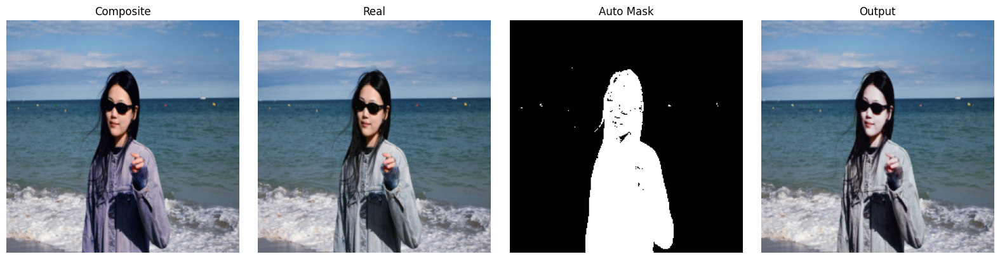

In [ ]:
import torch
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# 1. Load the model structure and weight
model = UNetWithGIFT()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load("/content/Unet4_epoch30t_time.pth", map_location=device))
model.to(device)
model.eval()

# 2. Image path
composite_path = '/content/compositeimage.jpg'
real_path = '/content/groundtruth.jpg'

# 3. Image preprocessing
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

comp_img = Image.open(composite_path).convert('RGB')
real_img = Image.open(real_path).convert('RGB')
comp = transform(comp_img).unsqueeze(0).to(device)
real = transform(real_img).unsqueeze(0).to(device)

# 4. Automatically construct a rough mask (based on the difference between real and comp)
diff = torch.abs(comp - real)
gray_diff = diff.mean(dim=1, keepdim=True)
threshold = 0.01
mask = (gray_diff < threshold).float().to(device)  # The parts with small differences are the characters
mask = 1.0 - mask

#  5. Build 4-channel input
input_tensor = torch.cat([comp, mask], dim=1)

# 6. Inference generates output
with torch.no_grad():
    output = model(input_tensor)

#  7. Visualize composite / real / output
def show_tensor_img(tensor, title='', cmap=None):
    img = tensor.detach().cpu().squeeze(0).permute(1, 2, 0).numpy()
    if img.shape[2] == 1:
        img = img[:, :, 0]
    img = (img * 255).astype('uint8') if img.max() <= 1.0 else img
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
show_tensor_img(comp, 'Composite')

plt.subplot(1, 4, 2)
show_tensor_img(real, 'Real')

plt.subplot(1, 4, 3)
show_tensor_img(mask, 'Auto Mask', cmap='gray')

plt.subplot(1, 4, 4)
show_tensor_img(output, 'Output')

plt.tight_layout()
plt.show()

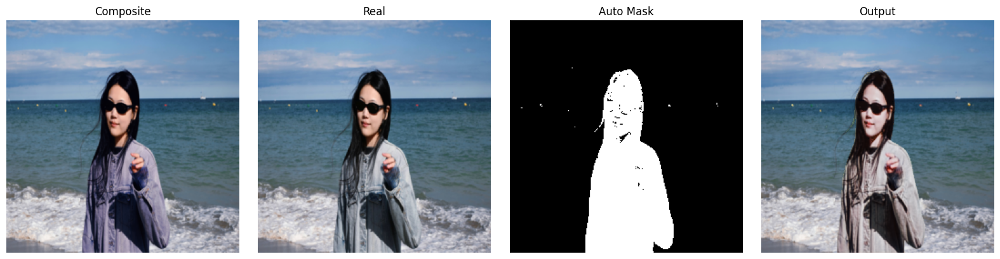

In [ ]:
# 50epoch

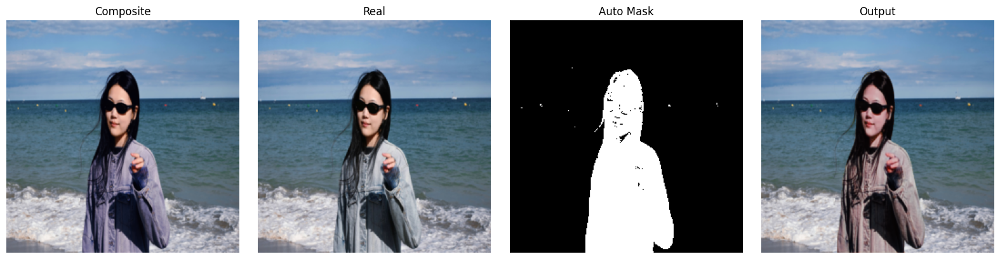

In [ ]:
# 70 epoch

To assess the generalization capability of the trained model, I further tested the three saved checkpoints (30, 50, and 70 epochs) on a custom image. Unlike the training dataset, the composite image used here was manually adjusted and does not follow physically accurate lighting conditions. Additionally, the foreground mask was automatically generated and thus contains noise and boundary artifacts.

Despite these limitations, the model outputs across all checkpoints demonstrate a reasonable degree of harmonization. I observed that the output of the 70 epoch model is not necessarily better than the 30 epoch model in terms of overall color harmony. However, the output of the 70 epoch model is better in terms of fine details such as hair or shadow edges. The output of the 50 epoch model shows obvious inconsistencies in the hair. This also shows that the performance of the model is affected by the quality of the mask of the input synthetic image.
Overall, this user-defined test highlights both the potential and limitations of the model when deployed in uncontrolled, real-world scenarios. Improving mask accuracy—e.g., using more robust segmentation models or manual refinement—and enhancing the model’s robustness to lighting mismatches could be beneficial for real-world deployment.